In [1]:
import pickle
import matplotlib.pyplot as plt
import numpy as np

In [6]:
loc = ['local'] # eventually append distal
cont = ['0.0','0.1','0.2','0.3','0.4'] # contrast
chr2tar = ['PV','SOM'] # chr2 target
chr2str = ['0.0','0.1','0.2'] # only do these three
for l in loc:
    for c in cont:
        for t in chr2tar:
            for s in chr2str:
                filedir = '%s'%l+'_'+'%s'%c+'_'+'%s'%t+'_'+'%s'%s
                print(filedir)

local_0.0_PV_0.0
local_0.0_PV_0.1
local_0.0_PV_0.2
local_0.0_SOM_0.0
local_0.0_SOM_0.1
local_0.0_SOM_0.2
local_0.1_PV_0.0
local_0.1_PV_0.1
local_0.1_PV_0.2
local_0.1_SOM_0.0
local_0.1_SOM_0.1
local_0.1_SOM_0.2
local_0.2_PV_0.0
local_0.2_PV_0.1
local_0.2_PV_0.2
local_0.2_SOM_0.0
local_0.2_SOM_0.1
local_0.2_SOM_0.2
local_0.3_PV_0.0
local_0.3_PV_0.1
local_0.3_PV_0.2
local_0.3_SOM_0.0
local_0.3_SOM_0.1
local_0.3_SOM_0.2
local_0.4_PV_0.0
local_0.4_PV_0.1
local_0.4_PV_0.2
local_0.4_SOM_0.0
local_0.4_SOM_0.1
local_0.4_SOM_0.2


In [2]:
filedir = 'local_0.0_PV_0.1'
#filedir = '0.0_PV_'+'%s'%stimstr
#filedir = '%.1f'%stimstr
with open('%s/all_spikes.pickle'%filedir, 'rb') as file:
    all_spikes = pickle.load(file)
print('%s/all_spikes.pickle'%filedir)

local_0.0_PV_0.1/all_spikes.pickle


In [2]:
print('ChR2 times = ')
print(np.array([range(0,10,10)+epo for epo in np.arange(500,1000000,1000)]))

ChR2 times = 
[[   500]
 [  1500]
 [  2500]
 [  3500]
 [  4500]
 [  5500]
 [  6500]
 [  7500]
 [  8500]
 [  9500]
 [ 10500]
 [ 11500]
 [ 12500]
 [ 13500]
 [ 14500]
 [ 15500]
 [ 16500]
 [ 17500]
 [ 18500]
 [ 19500]
 [ 20500]
 [ 21500]
 [ 22500]
 [ 23500]
 [ 24500]
 [ 25500]
 [ 26500]
 [ 27500]
 [ 28500]
 [ 29500]
 [ 30500]
 [ 31500]
 [ 32500]
 [ 33500]
 [ 34500]
 [ 35500]
 [ 36500]
 [ 37500]
 [ 38500]
 [ 39500]
 [ 40500]
 [ 41500]
 [ 42500]
 [ 43500]
 [ 44500]
 [ 45500]
 [ 46500]
 [ 47500]
 [ 48500]
 [ 49500]
 [ 50500]
 [ 51500]
 [ 52500]
 [ 53500]
 [ 54500]
 [ 55500]
 [ 56500]
 [ 57500]
 [ 58500]
 [ 59500]
 [ 60500]
 [ 61500]
 [ 62500]
 [ 63500]
 [ 64500]
 [ 65500]
 [ 66500]
 [ 67500]
 [ 68500]
 [ 69500]
 [ 70500]
 [ 71500]
 [ 72500]
 [ 73500]
 [ 74500]
 [ 75500]
 [ 76500]
 [ 77500]
 [ 78500]
 [ 79500]
 [ 80500]
 [ 81500]
 [ 82500]
 [ 83500]
 [ 84500]
 [ 85500]
 [ 86500]
 [ 87500]
 [ 88500]
 [ 89500]
 [ 90500]
 [ 91500]
 [ 92500]
 [ 93500]
 [ 94500]
 [ 95500]
 [ 96500]
 [ 97500]
 [ 985

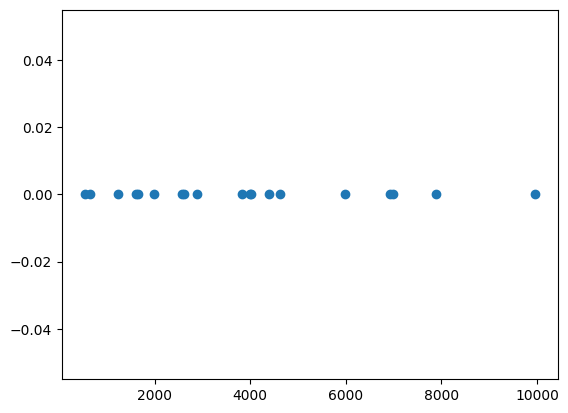

In [8]:
#np.shape(all_spikes)
np.shape(all_spikes[:8000][0])
plt.plot(all_spikes[:8000][0], np.zeros(len(all_spikes[:8000][0])),linestyle='',marker='o')

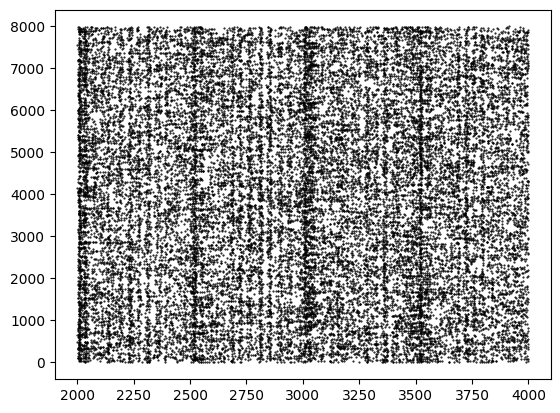

In [3]:
for i in range(8000):
    spikeTimes = all_spikes[:8000][i][all_spikes[:8000][i]<4000]
    spikeTimes = spikeTimes[spikeTimes>2000]
    index = i*np.ones(len(spikeTimes))
    plt.plot(spikeTimes, index, linestyle='',marker='o', color='black',markersize=0.5)

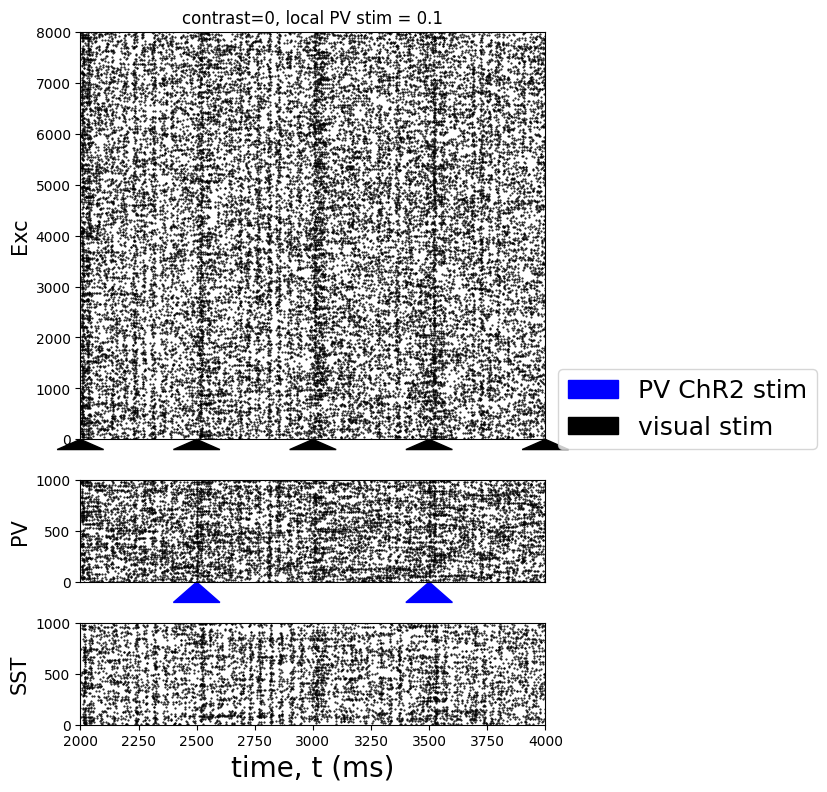

In [33]:
import matplotlib.patches as mpatches
blue_patch = mpatches.Patch(color='blue', label='PV ChR2 stim')
black_patch = mpatches.Patch(color='black', label='visual stim')

tmax = 4000
tmin = 2000
order = 1000

# test out plotting code   
fig, axes = plt.subplots(3,1,figsize = (6,9),gridspec_kw = {'height_ratios':[4,1,1]})

ax0 = axes[0]
ax0.set_title('contrast=0, local PV stim = 0.1')
ax0.set_ylabel('Exc',fontsize=15)
ax0.set_xticks([])
ax0.set_ylim([0,8*order])
ax0.set_xlim([tmin,tmax])
for i in range(8*order):
    spikeTimes = all_spikes[:8*order][i][all_spikes[:8*order][i]<tmax]
    spikeTimes = spikeTimes[spikeTimes>tmin]
    index = i*np.ones(len(spikeTimes))
    ax0.plot(spikeTimes, index, linestyle='',marker='o', color='black',markersize=0.5)
ax0.add_patch(plt.Polygon((np.array([[1900,-200],[2000,0],[2100,-200]])),clip_on=False,color='black'))
ax0.add_patch(plt.Polygon((np.array([[2400,-200],[2500,0],[2600,-200]])),clip_on=False,color='black'))
ax0.add_patch(plt.Polygon((np.array([[2900,-200],[3000,0],[3100,-200]])),clip_on=False,color='black'))
ax0.add_patch(plt.Polygon((np.array([[3400,-200],[3500,0],[3600,-200]])),clip_on=False,color='black'))
ax0.add_patch(plt.Polygon((np.array([[3900,-200],[4000,0],[4100,-200]])),clip_on=False,color='black'))

ax1 = axes[1]
ax1.set_xlim([tmin,tmax])
ax1.set_ylim([0,order])
ax1.set_ylabel('PV',fontsize=15)
ax1.set_xticks([])
for i in range(1000):
    spikeTimes = all_spikes[8*order:9*order][i][all_spikes[8*order:9*order][i]<tmax]
    spikeTimes = spikeTimes[spikeTimes>tmin]
    index = i*np.ones(len(spikeTimes))
    ax1.plot(spikeTimes, index, linestyle='',marker='o', color='black',markersize=0.5)
ax1.add_patch(plt.Polygon((np.array([[2400,-200],[2500,0],[2600,-200]])),clip_on=False,color='blue'))
ax1.add_patch(plt.Polygon((np.array([[3400,-200],[3500,0],[3600,-200]])),clip_on=False,color='blue'))
ax1.legend(handles=[blue_patch,black_patch], loc='center left', bbox_to_anchor=(1, 1.7), fontsize=18)

ax2 = axes[2]
ax2.set_ylim([0,order])
ax2.set_xlim([tmin,tmax])
ax2.set_ylabel('SST',fontsize=15)
ax2.set_xlabel('time, t (ms)',fontsize=20)
for i in range(1000):
    spikeTimes = all_spikes[9*order:][i][all_spikes[9*order:][i]<tmax]
    spikeTimes = spikeTimes[spikeTimes>tmin]
    index = i*np.ones(len(spikeTimes))
    ax2.plot(spikeTimes, index, linestyle='',marker='o', color='black',markersize=0.5)
    


plt.show()

In [14]:
def makeRaster(l,c,t,s,tmin=2000,tmax=4000,order=1000,saveFig=True):
    import matplotlib.patches as mpatches
    #filename = '%s'%l+'_'+'%s'%c+'_'+'%s'%t+'_'+'%s'%s
    filedir = '%s'%l+'_'+'%s'%c+'_'+'%s'%t+'_'+'%s'%s
    with open('%s/all_spikes.pickle'%filedir, 'rb') as file:
        all_spikes = pickle.load(file)
    
    blue_patch = mpatches.Patch(color='blue', label='PV ChR2 stim')
    orange_patch = mpatches.Patch(color='orange', label='SST ChR2 stim')
    black_patch = mpatches.Patch(color='black', label='visual stim')
        
    
    # test out plotting code   
    fig, axes = plt.subplots(3,1,figsize = (6,9),gridspec_kw = {'height_ratios':[4,1,1]})

    ax0 = axes[0]
    ax0.set_title('contrast='+str(c)+', '+str(l)+' '+str(t)+' stim = '+str(s), fontsize=20)
    ax0.set_ylabel('Exc',fontsize=18)
    ax0.set_xticks([])
    ax0.set_ylim([0,8*order])
    ax0.set_xlim([tmin,tmax])
    for i in range(8*order):
        spikeTimes = all_spikes[:8*order][i][all_spikes[:8*order][i]<tmax]
        spikeTimes = spikeTimes[spikeTimes>tmin]
        index = i*np.ones(len(spikeTimes))
        ax0.plot(spikeTimes, index, linestyle='',marker='o', color='black',markersize=0.5)
    ax0.add_patch(plt.Polygon((np.array([[1900,-200],[2000,0],[2100,-200]])),clip_on=False,color='black'))
    ax0.add_patch(plt.Polygon((np.array([[2400,-200],[2500,0],[2600,-200]])),clip_on=False,color='black'))
    ax0.add_patch(plt.Polygon((np.array([[2900,-200],[3000,0],[3100,-200]])),clip_on=False,color='black'))
    ax0.add_patch(plt.Polygon((np.array([[3400,-200],[3500,0],[3600,-200]])),clip_on=False,color='black'))
    ax0.add_patch(plt.Polygon((np.array([[3900,-200],[4000,0],[4100,-200]])),clip_on=False,color='black'))

    ax1 = axes[1]
    ax1.set_xlim([tmin,tmax])
    ax1.set_ylim([0,order])
    ax1.set_ylabel('PV',fontsize=18)
    ax1.set_xticks([])
    for i in range(1000):
        spikeTimes = all_spikes[8*order:9*order][i][all_spikes[8*order:9*order][i]<tmax]
        spikeTimes = spikeTimes[spikeTimes>tmin]
        index = i*np.ones(len(spikeTimes))
        ax1.plot(spikeTimes, index, linestyle='',marker='o', color='black',markersize=0.5)
    if t == 'PV':
        ax1.add_patch(plt.Polygon((np.array([[2400,-200],[2500,0],[2600,-200]])),clip_on=False,color='blue'))
        ax1.add_patch(plt.Polygon((np.array([[3400,-200],[3500,0],[3600,-200]])),clip_on=False,color='blue'))
        ax1.legend(handles=[blue_patch,black_patch], loc='center left', bbox_to_anchor=(1, 1.7), fontsize=18)

    
    ax2 = axes[2]
    ax2.set_ylim([0,order])
    ax2.set_xlim([tmin,tmax])
    ax2.set_ylabel('SST',fontsize=18)
    ax2.set_xlabel('time, t (ms)',fontsize=20)
    for i in range(1000):
        spikeTimes = all_spikes[9*order:][i][all_spikes[9*order:][i]<tmax]
        spikeTimes = spikeTimes[spikeTimes>tmin]
        index = i*np.ones(len(spikeTimes))
        ax2.plot(spikeTimes, index, linestyle='',marker='o', color='black',markersize=0.5)
    ax2.tick_params(axis='x',labelsize=12)
    if t == 'SOM':
        ax2.add_patch(plt.Polygon((np.array([[2400,1200],[2500,1000],[2600,1200]])),clip_on=False,color='orange'))
        ax2.add_patch(plt.Polygon((np.array([[3400,1200],[3500,1000],[3600,1200]])),clip_on=False,color='orange'))
        ax1.legend(handles=[orange_patch,black_patch], loc='center left', bbox_to_anchor=(1, 1.7), fontsize=18)
    
    if saveFig:
        savedir = 'new_rasters'
        #'%s/all_spikes.pickle'%filedir
        destination = '%s/'%savedir + '%s'%filedir
        plt.savefig(destination+'.png',bbox_inches='tight',dpi=200)
    #plt.show()

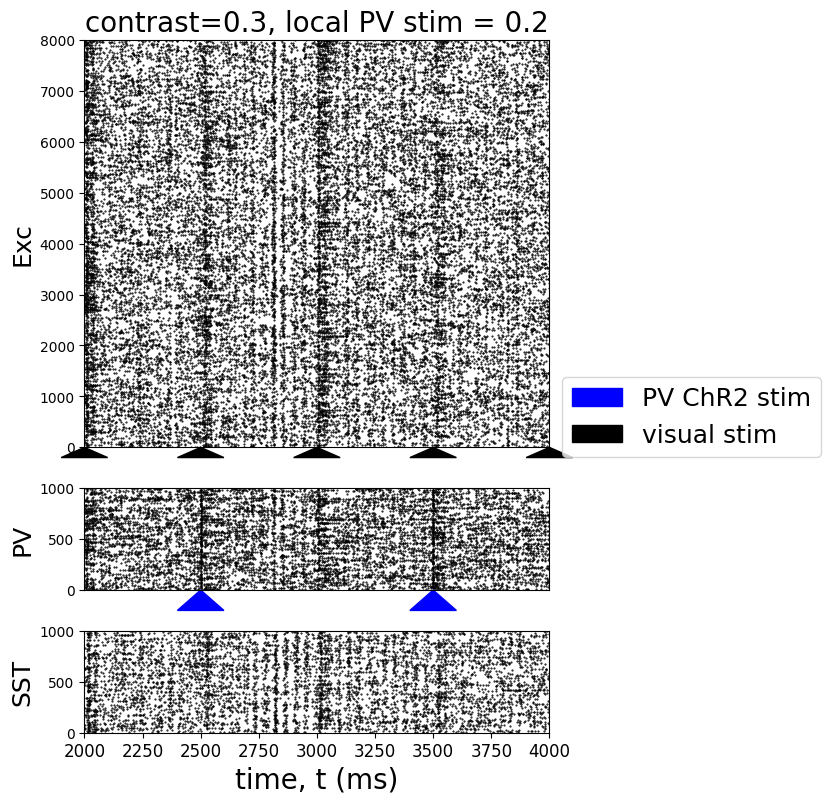

In [16]:
makeRaster('local','0.3','PV','0.2')

local_0.0_PV_0.0
local_0.0_PV_0.1
local_0.0_PV_0.2
local_0.0_SOM_0.0
local_0.0_SOM_0.1
local_0.0_SOM_0.2
local_0.1_PV_0.0
local_0.1_PV_0.1
local_0.1_PV_0.2
local_0.1_SOM_0.0
local_0.1_SOM_0.1
local_0.1_SOM_0.2
local_0.2_PV_0.0
local_0.2_PV_0.1
local_0.2_PV_0.2
local_0.2_SOM_0.0
local_0.2_SOM_0.1
local_0.2_SOM_0.2
local_0.3_PV_0.0
local_0.3_PV_0.1
local_0.3_PV_0.2


/tmp/ipykernel_4136600/3367924111.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(3,1,figsize = (6,9),gridspec_kw = {'height_ratios':[4,1,1]})


local_0.3_SOM_0.0
local_0.3_SOM_0.1
local_0.3_SOM_0.2
local_0.4_PV_0.0
local_0.4_PV_0.1
local_0.4_PV_0.2
local_0.4_SOM_0.0
local_0.4_SOM_0.1
local_0.4_SOM_0.2


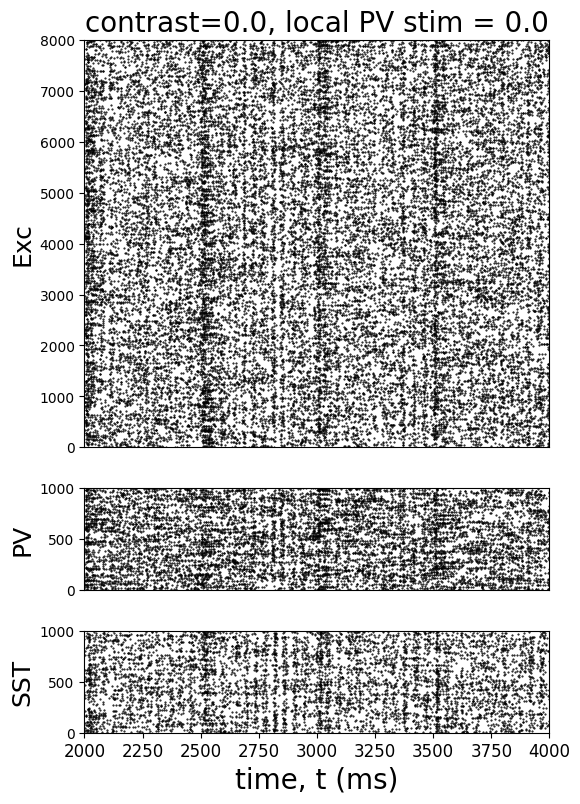

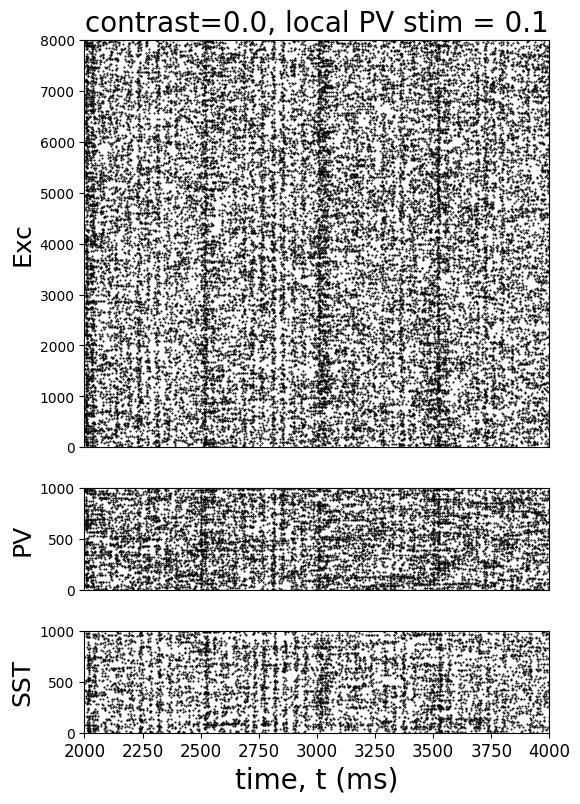

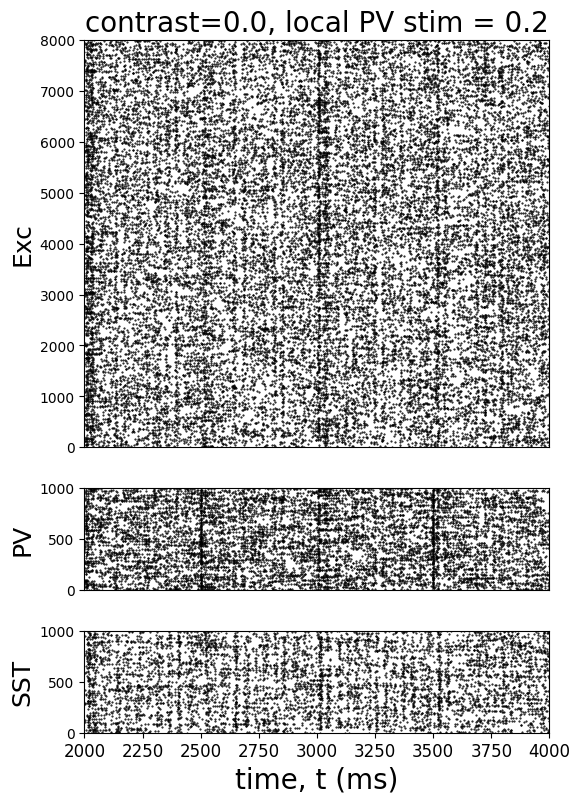

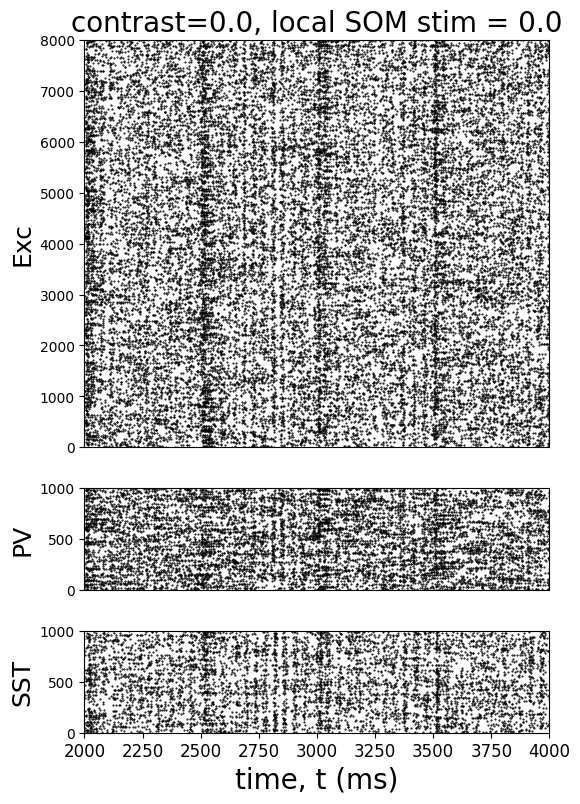

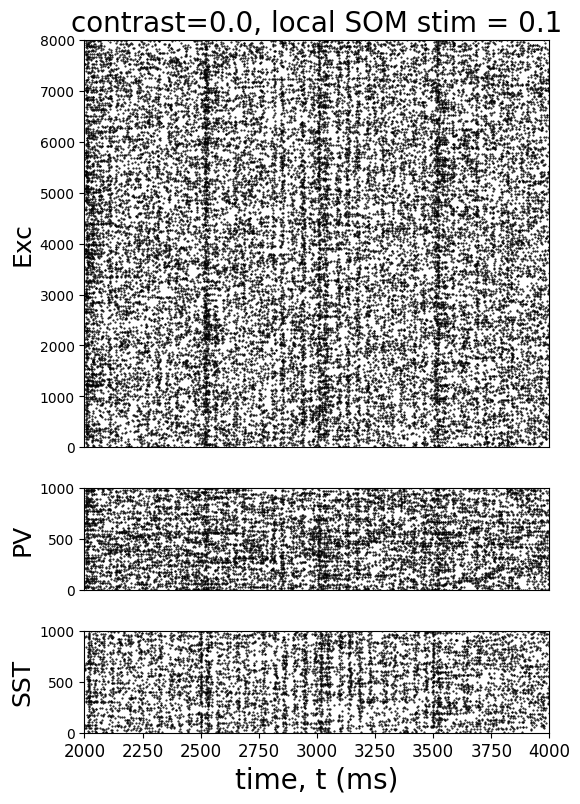

...

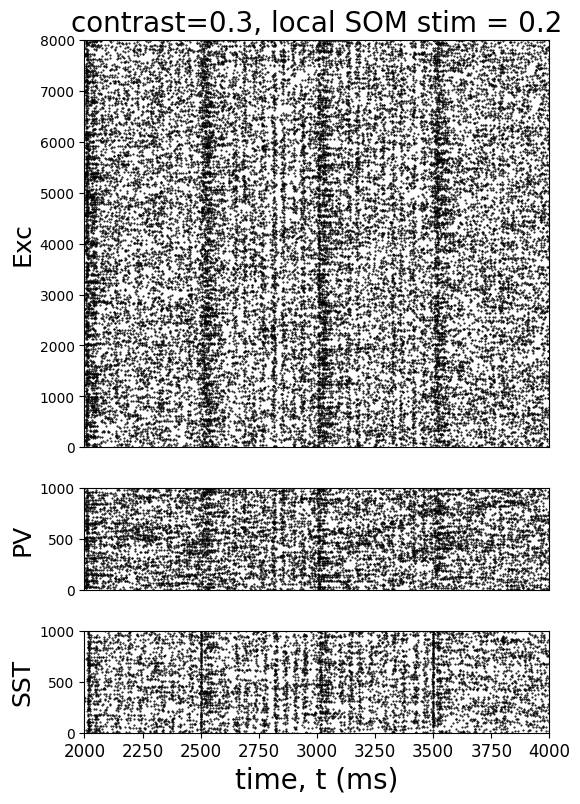

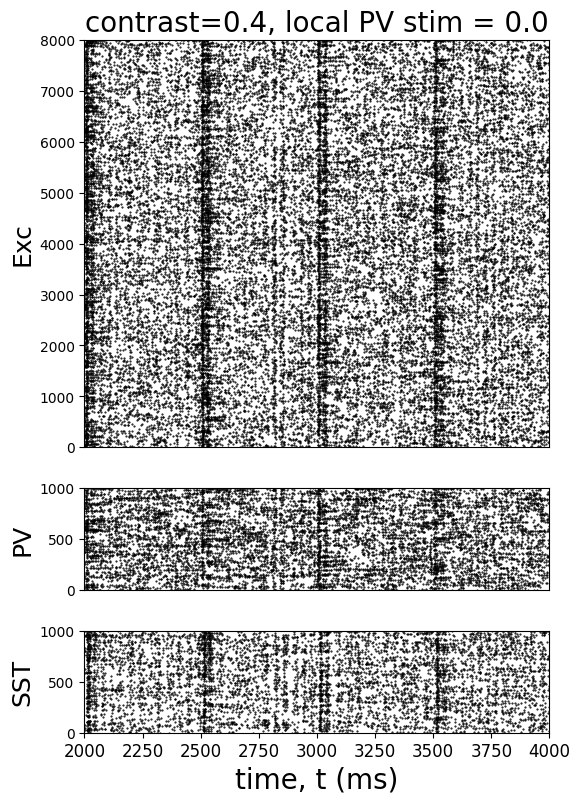

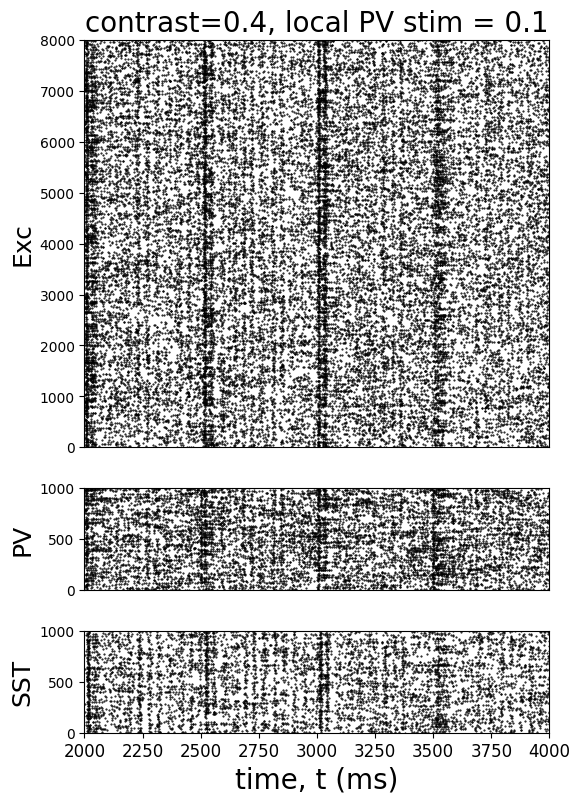

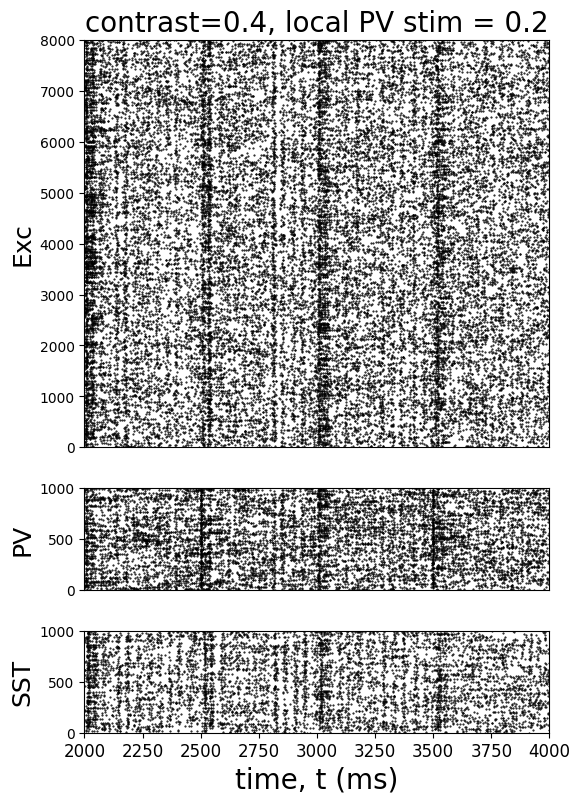

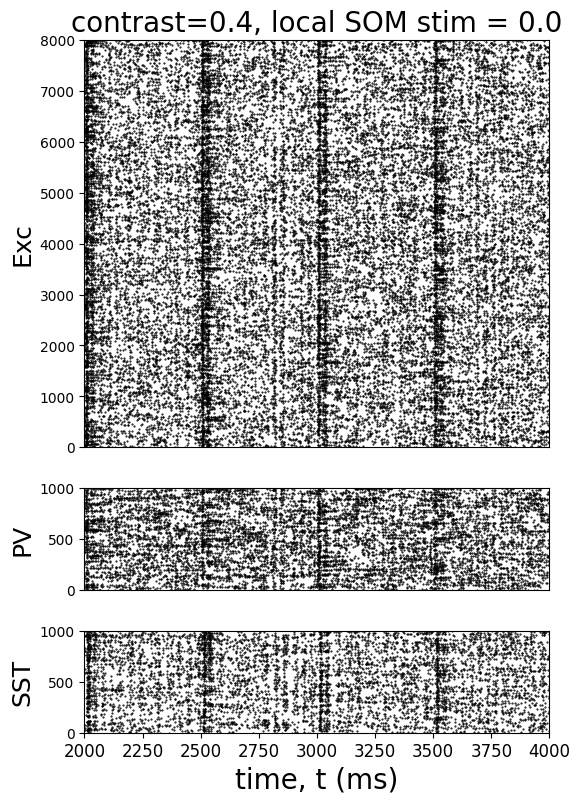

Error in callback <function flush_figures at 0x7fb6e929f400> (for post_execute):


KeyboardInterrupt: 

In [7]:
loc = ['local'] # eventually append distal
cont = ['0.0','0.1','0.2','0.3','0.4'] # contrast
chr2tar = ['PV','SOM'] # chr2 target
chr2str = ['0.0','0.1','0.2'] # only do these three
for l in loc:
    for c in cont:
        for t in chr2tar:
            for s in chr2str:
                filedir = '%s'%l+'_'+'%s'%c+'_'+'%s'%t+'_'+'%s'%s
                with open('%s/all_spikes.pickle'%filedir, 'rb') as file:
                    all_spikes = pickle.load(file)
                print(filedir)
                makeRaster(all_spikes,l,c,t,s)